# Model 5

# Multiclass Retinal Image Classifier - 5 Diseases (MH, MYA, BRVO, TSLN,  and BRVO). 

## Mark Whelly - BrainStation Data Science Bootcamp - August 2022

Transfer Learning Model using InceptionV3. Working on Google Colab Cloud environment.

This CNN model uses all data for Normal and the 5 disease classes listed above. These conditions are serious eye diseases and disorders that affect a large proportion of eye patients globally and are represented by large numbers of the images in the dataset. 

It only uses images with just 1 condition present (i.e., no images with multiple diseases present were used in this model, in order to first develop a classifier for single disease incidence.) At this stage (fifth model), data exploration specific to the 5 diseases was done mainly in excel using Sort and Filter functions to examine how many images fit the category of 'single disease' for each of the 5 diseases plus Normal class.

The 5 diseases of focus for this model include:

1) MH (Media Haze): this condition relates to numerous conditions including cataracts, vitreous opacities, corneal edema or small pupils, but can also indicate artifacts from image collection (eyelash, reflection, artifacts from the instrument).

2) MYA (Myopia): degeneration of the choroid, sclera and retinal pigment epithelium (RPE).

3) BRVO (Branch Retinal Vein Occlusion): related to the most common disorder linked to blurred peripheral vision, and is associated with blood clot/stroke. 

4) TSLN (Tesselation): this condition relates to thinning of the RPE and choriocapillaris. This database only included moderate to severe cases, which can serve as an indicator of myopia.

5) ODC (Ocular Disc Cupping): this condition relates to thinning of the rim of the optic nerve; pathological ODC is generally referred to as glaucoma, although other conditions can also lead to ODC.

In [ ]:
#Set up to work on Google Colab
import os

In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
# import libraries and packages
import numpy as np 
import pandas as pd
import zipfile
import csv
import tensorflow as tf
from pathlib import Path
import cv2
import os
from google.colab.patches import cv2_imshow


from tensorflow import keras
from tensorflow.keras.layers import Input
from tensorflow.python.keras.models import Input
from tensorflow.python.keras.utils.data_utils import Sequence
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import Model
from tensorflow.keras import layers
from tensorflow.keras.layers import Conv2D, MaxPooling2D

# Import skimage modules
import skimage
import skimage.io
from skimage import data, img_as_float
from skimage import exposure
from skimage.exposure import equalize_hist
from PIL import Image, ImageEnhance

import warnings

In [ ]:
# set random seed
tf.random.set_seed(42)

In [ ]:
# further libraries
try:
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, LSTM, Dropout, Flatten, GRU, Bidirectional
    from tensorflow.keras.optimizers import SGD
except:
    !pip install keras
    !pip install h5py==3.1.0 numpy==1.19.2 six==1.15.0 typing-extensions==3.7.4 wrapt==1.12.1 botocore==1.20.106 gast==0.4.0 tensorboard==2.6 tensorflow-estimator==2.6 absl-py==0.9 protobuf==3.11.2 scikit-learn==0.24 fsspec==2021.07.0 google-api-python-client==1.12.1
    !pip install --upgrade tensorflow
    !pip install --ignore-installed --upgrade tensorflow-gpu==1.15.0
    import tensorflow as tf
    from tensorflow.keras.models import Sequential
    from tensorflow.keras.layers import Dense, LSTM, Dropout, GRU, Bidirectional
    from tensorflow.keras.optimizers import SGD

In [ ]:
# further libraries for tf and matplotlib
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix
from tensorflow.keras.preprocessing import image

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.pyplot import imread, imshow, show, subplot, title, get_cmap, hist

import seaborn as sns
import shutil
from tqdm import tqdm

# PART 1 - Data Preparation and Organization

## 1.1. Training Set

Grouping images into separate folders per disease type was previously completed for the 
'Top8 Multiclass' model provided as a separate notebook. 

Copies of the 5 folders (with histogram equalization preprocessing applied to each image) required for this Top-5 Multiclass model were made into the directory 'TrainSing6', with new subfolders for each of the 5 diseases plus normal class, in Colab folders. 

In [ ]:
cd/gdrive/My Drive/Retimages/Train/

/gdrive/My Drive/Retimages/Train


In [ ]:
# IMPORTING my Train csv prepared for Top 8 Diseases 
# (also used here for Top 5 model, ignoring diseases that are not required)
train = pd.read_csv('Train_Labels_singleCOM.csv')
train = train.dropna(axis='columns')
train

,ID,DisCode,Normal,DR,ARMD,MH,DN,MYA,BRVO,TSLN,ODC
0,10,0,1,0,0,0,0,0,0,0,0
1,16,0,1,0,0,0,0,0,0,0,0
2,17,0,1,0,0,0,0,0,0,0,0
3,21,0,1,0,0,0,0,0,0,0,0
4,28,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
1181,1908,6,0,0,0,0,0,0,1,0,0
1182,1909,7,0,0,0,0,0,0,0,1,0
1183,1910,7,0,0,0,0,0,0,0,1,0
1184,1914,7,0,0,0,0,0,0,0,1,0


In [ ]:
train.columns

Index(['Id', 'Normal', 'DR', 'ARMD', 'MH', 'DN', 'MYA', 'BRVO', 'TSLN', 'ODC',
       'Diseases'],
      dtype='object')

In [ ]:
# Select labels for Top 5 Disease for later use in confusion matrix
LABELS=['Normal', 'MH', 'MYA', 'BRVO', 'TSLN', 'ODC']

## 1.2  Validation Set

In [ ]:
cd/gdrive/My Drive/Retimages/Validation/

/gdrive/My Drive/Retimages/Validation


In [ ]:
#IMPORTING my Validation csv
valid = pd.read_csv('Valid_Labels_SingleCOM.csv') 

In [ ]:
valid['Normal'] = np.where(valid['Disease_Risk'] == 0,1,0)

valid.drop('Disease_Risk', inplace=True, axis=1)

valid.drop('ID', inplace=True, axis=1)

In [ ]:
valid['Diseases'] = valid.where(valid == 0, 
                                  other=valid.apply(lambda x: x.name),
                                  axis=1).where(valid != 0, 
                                                other="").apply(lambda row: ''.join(row.values), axis=1)

In [ ]:
valid['Diseases'] = valid['Diseases'].astype(str)

valid['Id'] = range(1, len(valid) + 1)

In [ ]:
# shift column 'C' to first position
first_column = valid.pop('Id')

# insert column using insert(position,column_name,first_column) function
valid.insert(0, 'Id', first_column)

second_column = valid.pop('Normal')
valid.insert(1, 'Normal', second_column)

valid

,Id,Normal,DisCode,COMMON,inclCOMM,rares,DR,ARMD,MH,DN,MYA,BRVO,TSLN,ODC,Diseases
0,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Normal
1,2,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Normal
2,3,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Normal
3,4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Normal
4,5,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
477,478,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DisCodeCOMMONinclCOMMraresDRARMDMHDNMYABRVOTSL...
478,479,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DisCodeCOMMONinclCOMMraresDRARMDMHDNMYABRVOTSL...
479,480,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DisCodeCOMMONinclCOMMraresDRARMDMHDNMYABRVOTSL...
480,481,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DisCodeCOMMONinclCOMMraresDRARMDMHDNMYABRVOTSL...


In [ ]:
valid['Diseases'][2]

'LS'

In [ ]:
y_valid = np.array(valid.drop(['Id', 'Diseases'],axis=1))
y_valid.shape

(640, 46)

In [ ]:
cd/gdrive/My Drive/Retimages/Test/TestSingCOM

/gdrive/My Drive/Retimages/Test/TestSingCOM


In [ ]:
# Preprocessing function to equalize contrast histograms for each image

def hist_equalize(im, clahe=True, bgr=True):
    # Equalize histogram on BGR image 'im' with im.shape(n,m,3) and range 0-255
    yuv = cv2.cvtColor(im, cv2.COLOR_BGR2YUV if bgr else cv2.COLOR_RGB2YUV)
    if clahe:
        c = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
        yuv[:, :, 0] = c.apply(yuv[:, :, 0])
    else:
        yuv[:, :, 0] = cv2.equalizeHist(yuv[:, :, 0])  # equalize Y channel histogram
    return cv2.cvtColor(yuv, cv2.COLOR_YUV2BGR if bgr else cv2.COLOR_YUV2RGB)  # convert YUV image to RGB

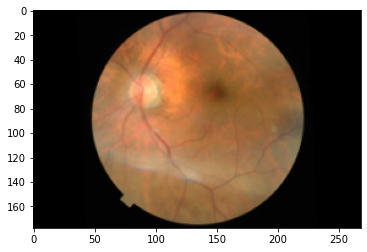

In [ ]:
# DO NOT RUN

import skimage
import skimage.io
from skimage import data, img_as_float
from skimage import exposure

image = skimage.io.imread(fname="/gdrive/My Drive/Retimages/Train/TrainSingCOM/7TSLN/dr2_1_7107.png")
plt.imshow(image)

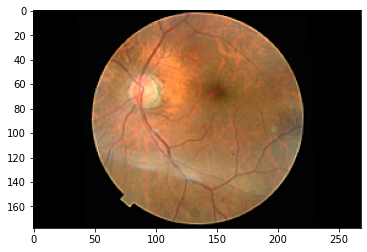

In [ ]:
# Demonstrate hist_equalize


from PIL import Image, ImageEnhance

im = Image.open("/gdrive/My Drive/Retimages/Train/TrainSingCOM/7TSLN/dr2_1_7107.png")
enhancer = ImageEnhance.Sharpness(im)
factor = 5
im_s = enhancer.enhance(factor)
#im_s.save('sharpened-image.png');
plt.imshow((im_s))

In [ ]:
#  make copies of images from Top8 directory to Top5 directory, for each class.
# here are Validation commands. Train and Test Sets used same code previously.:
# Class 0
warnings.filterwarnings("ignore")
destination_path = '/gdrive/My Drive/Retimages/Validation/ValSing6/0Normal/'
origin_path = '/gdrive/My Drive/Retimages/Validation/ValSingCOMeq/0Normal/'
format_of_your_images = '.png'
all_the_files = Path(origin_path).rglob(f'*{format_of_your_images}')

In [ ]:
# run function
for f in all_the_files:
  img_in = cv2.imread(str(f))
  cv2.imwrite(f'{destination_path}/{f.name}', img_in)

In [ ]:
# Class 1
warnings.filterwarnings("ignore")
destination_path = '/gdrive/My Drive/Retimages/Validation/ValSing6/1MH/'
origin_path = '/gdrive/My Drive/Retimages/Validation/ValSingCOMeq/3MH/'
format_of_your_images = '.png'
all_the_files = Path(origin_path).rglob(f'*{format_of_your_images}')

In [ ]:
# run function
for f in all_the_files:
  img_in = cv2.imread(str(f))
  cv2.imwrite(f'{destination_path}/{f.name}', img_in)

In [ ]:
# Class 2
warnings.filterwarnings("ignore")
destination_path = '/gdrive/My Drive/Retimages/Validation/ValSing6/2MYA/'
origin_path = '/gdrive/My Drive/Retimages/Validation/ValSingCOMeq/5MYA/'
format_of_your_images = '.png'
all_the_files = Path(origin_path).rglob(f'*{format_of_your_images}')

In [ ]:
# run function
for f in all_the_files:
  img_in = cv2.imread(str(f))
  cv2.imwrite(f'{destination_path}/{f.name}', img_in)

In [ ]:
# Class 3
warnings.filterwarnings("ignore")
destination_path = '/gdrive/My Drive/Retimages/Validation/ValSing6/3BRVO/'
origin_path = '/gdrive/My Drive/Retimages/Validation/ValSingCOMeq/6BRVO/'
format_of_your_images = '.png'
all_the_files = Path(origin_path).rglob(f'*{format_of_your_images}')

In [ ]:
# run function
for f in all_the_files:
  img_in = cv2.imread(str(f))
  cv2.imwrite(f'{destination_path}/{f.name}', img_in)

In [ ]:
# Class 4
warnings.filterwarnings("ignore")
destination_path = '/gdrive/My Drive/Retimages/Validation/ValSing6/4TSLN/'
origin_path = '/gdrive/My Drive/Retimages/Validation/ValSingCOMeq/7TSLN/'
format_of_your_images = '.png'
all_the_files = Path(origin_path).rglob(f'*{format_of_your_images}')

In [ ]:
# run function
for f in all_the_files:
  img_in = cv2.imread(str(f))
  cv2.imwrite(f'{destination_path}/{f.name}', img_in)

In [ ]:
# Class 5
warnings.filterwarnings("ignore")
destination_path = '/gdrive/My Drive/Retimages/Validation/ValSing6/5ODC/'
origin_path = '/gdrive/My Drive/Retimages/Validation/ValSingCOMeq/8ODC/'
format_of_your_images = '.png'
all_the_files = Path(origin_path).rglob(f'*{format_of_your_images}')

In [ ]:
# run function
for f in all_the_files:
  img_in = cv2.imread(str(f))
  cv2.imwrite(f'{destination_path}/{f.name}', img_in)

In [ ]:
cd/gdrive/My Drive/Retimages/

/gdrive/My Drive/Retimages


In [ ]:
# Number of images per class - TRAINING folders
train_Normal_dir = os.path.join('./Train/TrainSing6/0Normal')
train_MH_dir = os.path.join('./Train/TrainSing6/1MH')
train_MYA_dir = os.path.join('./Train/TrainSing6/2MYA')
train_BRVO_dir = os.path.join('./Train/TrainSing6/3BRVO')
train_TSLN_dir = os.path.join('./Train/TrainSing6/4TSLN')
train_ODC_dir = os.path.join('./Train/TrainSing6/5ODC')

train_Normal_names = os.listdir(train_Normal_dir)
train_MH_names = os.listdir(train_MH_dir)
train_MYA_names = os.listdir(train_MYA_dir)
train_BRVO_names = os.listdir(train_BRVO_dir)
train_TSLN_names = os.listdir(train_TSLN_dir)
train_ODC_names = os.listdir(train_ODC_dir)

print('total training images of Normal:', len(os.listdir(train_Normal_dir)))
print('total training images of MH:', len(os.listdir(train_MH_dir)))
print('total training images of MYA:', len(os.listdir(train_MYA_dir)))
print('total training images of BRVO:', len(os.listdir(train_BRVO_dir)))
print('total training images of TSLN:', len(os.listdir(train_TSLN_dir)))
print('total training images of ODC:', len(os.listdir(train_ODC_dir)))

total training images of Normal: 401
total training images of MH: 180
total training images of MYA: 138
total training images of BRVO: 162
total training images of TSLN: 115
total training images of ODC: 236


In [ ]:
# Total number TRAINING images
Num_Train_Images = len(os.listdir(train_Normal_dir)) + len(os.listdir(train_MH_dir)) + len(os.listdir(train_MYA_dir)) + len(os.listdir(train_BRVO_dir)) + len(os.listdir(train_TSLN_dir)) + len(os.listdir(train_ODC_dir))
Num_Train_Images

1232

In [ ]:
# Number of images per class - VALIDATION folders
validation_Normal_dir = os.path.join('./Validation/ValSing6/0Normal')
validation_MH_dir = os.path.join('./Validation/ValSing6/1MH')
validation_MYA_dir = os.path.join('./Validation/ValSing6/2MYA')
validation_BRVO_dir = os.path.join('./Validation/ValSing6/3BRVO')
validation_TSLN_dir = os.path.join('./Validation/ValSing6/4TSLN')
validation_ODC_dir = os.path.join('./Validation/ValSing6/5ODC')

validation_Normal_names = os.listdir(validation_Normal_dir)
validation_MH_names = os.listdir(validation_MH_dir)
validation_MYA_names = os.listdir(validation_MYA_dir)
validation_BRVO_names = os.listdir(validation_BRVO_dir)
validation_TSLN_names = os.listdir(validation_TSLN_dir)
validation_ODC_names = os.listdir(validation_ODC_dir)

print('total validation images of normal:', len(os.listdir(validation_Normal_dir)))
print('total validation images of MH:', len(os.listdir(validation_MH_dir)))
print('total validation images of MYA:', len(os.listdir(validation_MYA_dir)))
print('total validation images of BRVO:', len(os.listdir(validation_BRVO_dir)))
print('total validation images of TSLN:', len(os.listdir(validation_TSLN_dir)))
print('total validation images of ODC:', len(os.listdir(validation_ODC_dir)))

total validation images of normal: 134
total validation images of MH: 124
total validation images of MYA: 106
total validation images of BRVO: 124
total validation images of TSLN: 80
total validation images of ODC: 108


In [ ]:
# Total number VALIDATION images
Num_Validation_Images = len(os.listdir(validation_Normal_dir)) + len(os.listdir(validation_MH_dir)) + len(os.listdir(validation_MYA_dir)) + len(os.listdir(validation_BRVO_dir)) + len(os.listdir(validation_TSLN_dir)) + len(os.listdir(validation_ODC_dir))
Num_Validation_Images

676

In [ ]:
# Number of images per class - TEST folders
test_Normal_dir = os.path.join('./Test/TestSing6/0Normal')
test_MH_dir = os.path.join('./Test/TestSing6/1MH')
test_MYA_dir = os.path.join('./Test/TestSing6/2MYA')
test_BRVO_dir = os.path.join('./Test/TestSing6/3BRVO')
test_TSLN_dir = os.path.join('./Test/TestSing6/4TSLN')
test_ODC_dir = os.path.join('./Test/TestSing6/5ODC')

test_Normal_names = os.listdir(test_Normal_dir)
test_MH_names = os.listdir(test_MH_dir)
test_MYA_names = os.listdir(test_MYA_dir)
test_BRVO_names = os.listdir(test_BRVO_dir)
test_TSLN_names = os.listdir(test_TSLN_dir)
test_ODC_names = os.listdir(test_ODC_dir)

print('total test images of normal:', len(os.listdir(test_Normal_dir)))
print('total test images of MH:', len(os.listdir(test_MH_dir)))
print('total test images of MYA:', len(os.listdir(test_MYA_dir)))
print('total test images of BRVO:', len(os.listdir(test_BRVO_dir)))
print('total test images of TSLN:', len(os.listdir(test_TSLN_dir)))
print('total test images of ODC:', len(os.listdir(test_ODC_dir)))

total test images of normal: 134
total test images of MH: 146
total test images of MYA: 102
total test images of BRVO: 108
total test images of TSLN: 77
total test images of ODC: 108


In [ ]:
# Total number TEST images
Num_Test_Images = len(os.listdir(test_Normal_dir)) + len(os.listdir(test_MH_dir)) + len(os.listdir(test_MYA_dir)) + len(os.listdir(test_BRVO_dir)) + len(os.listdir(test_TSLN_dir)) + len(os.listdir(test_ODC_dir))
Num_Test_Images

675

## Image Data Generators

In [ ]:
# set up ImageDataGenerator, train_generator
import cv2
import numpy as np
import random

height = 150
width = 220

train_datagen = ImageDataGenerator(rescale = 1./255.,
                                   vertical_flip = True,
                                   horizontal_flip = True,
                                   fill_mode='constant',
                                   cval=1)

train_generator = train_datagen.flow_from_directory('./Train/TrainSing6', 
                                                    target_size=(height,width), 
                                                    color_mode='rgb',
                                                    batch_size=Num_Train_Images,
                                                    shuffle=True,
                                                    class_mode='categorical')


Found 1232 images belonging to 6 classes.


In [ ]:
# define x_train and y_train from train generator: 
X_train, y_train = train_generator.next() 

In [ ]:
X_train.shape

(1232, 150, 220, 3)

In [ ]:
y_train.shape

(1232, 6)

In [ ]:
validation_datagen = ImageDataGenerator(rescale=1/255)
validation_generator = validation_datagen.flow_from_directory('./Validation/ValSing6', 
                                                              target_size=(height,width),
                                                              color_mode='rgb',
                                                              batch_size=Num_Validation_Images,
                                                              shuffle=True,
                                                              class_mode='categorical')

Found 676 images belonging to 6 classes.


In [ ]:
X_valid, y_valid = validation_generator.next()

In [ ]:
X_valid.shape

(676, 150, 220, 3)

In [ ]:
y_valid.shape

(676, 6)

In [ ]:
train_generator.class_indices

{'0Normal': 0, '1MH': 1, '2MYA': 2, '3BRVO': 3, '4TSLN': 4, '5ODC': 5}

In [ ]:
validation_generator.class_indices

{'0Normal': 0, '1MH': 1, '2MYA': 2, '3BRVO': 3, '4TSLN': 4, '5ODC': 5}

# Pretrained CNN Model

In [ ]:
# Load model at start of each run

from tensorflow.keras.models import Model
from tensorflow.keras.models import load_model
from tensorflow.keras.applications.inception_v3 import InceptionV3

In [ ]:
# Instantiate model
model=InceptionV3(weights='imagenet',
                  include_top=False,
                  input_shape=(height,width,3))

# Transfer Learning Model

In [ ]:
# Freeze all the layers in the base model
for layer in model.layers:
    layer.trainable = False

# select pretrained model layer
front_output = model.get_layer('mixed9').output

# Dropout Layer
dl_output = Dropout(0.5)(front_output) 

# add flatten layer
flat_output = Flatten()(dl_output)

# add fully connected layers
d1 = Dense(4096, activation='relu')(flat_output)
d2 = Dense(128, activation='relu')(d1)
#d3 = Dense(64, activation='relu')(d2)
#d4 = Dense(64, activation='relu')(d3)

# add output layer
output = Dense(6, activation='sigmoid')(d2) 

# create final model object
model = Model(inputs=model.input, 
              outputs=output)

In [ ]:
model.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 150, 220, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_376 (Conv2D)            (None, 74, 109, 32)  864         ['input_5[0][0]']                
                                                                                                  
 batch_normalization_376 (Batch  (None, 74, 109, 32)  96         ['conv2d_376[0][0]']             
 Normalization)                                                                                   
                                                                                            

### Training the Model

In [ ]:
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.optimizers import Adamax
from tensorflow.keras.optimizers import RMSprop

# callback to limit LR when validation loss plateaus
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.6,
                              patience=1,cooldown=1, min_lr=1e-5)

In [ ]:
import keras.backend as K

In [ ]:
# function to obtain F1 scores metric
def get_f1(y_test, y_pred): 
    true_positives = K.sum(K.round(K.clip(y_test * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_test, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    recall = true_positives / (possible_positives + K.epsilon())
    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())
    return f1_val

In [ ]:
#compile the model with Adamax or RMSprop or Adam optimizer
model.compile(optimizer='RMSprop',loss='categorical_crossentropy', metrics=[get_f1])

In [ ]:
# optional - early stopping
from tensorflow.keras.callbacks import EarlyStopping
early_stop = EarlyStopping(monitor='loss', 
                           patience=5, 
                           mode='min', 
                           verbose=1)

In [ ]:
# Optional - SET class weight dictionary for imbalanced training set
#classweights = {0:3,1:1, 2:1 , 3:1 , 4:1, 5:1 ,6:1 ,7:1 ,8:1}

history = model.fit(x=X_train, y=y_train, 
                    epochs=12,
                    validation_data = (X_valid,y_valid),
                    batch_size=42,
                    #class_weight = classweights,
                    callbacks=[reduce_lr]
                    )

Epoch 1/12
30/30 [==============================] - 8s 137ms/step - loss: 5.4764 - get_f1: 0.4694 - val_loss: 1.1358 - val_get_f1: 0.5552 - lr: 0.0010
Epoch 2/12
30/30 [==============================] - 3s 89ms/step - loss: 0.7076 - get_f1: 0.5983 - val_loss: 1.0149 - val_get_f1: 0.5131 - lr: 0.0010
Epoch 3/12
30/30 [==============================] - 3s 89ms/step - loss: 0.4848 - get_f1: 0.6225 - val_loss: 1.5075 - val_get_f1: 0.5426 - lr: 0.0010
Epoch 4/12
30/30 [==============================] - 3s 88ms/step - loss: 0.2608 - get_f1: 0.6635 - val_loss: 1.0647 - val_get_f1: 0.5916 - lr: 6.0000e-04
Epoch 5/12
30/30 [==============================] - 3s 89ms/step - loss: 0.1296 - get_f1: 0.6848 - val_loss: 1.3842 - val_get_f1: 0.5781 - lr: 3.6000e-04
Epoch 6/12
30/30 [==============================] - 3s 89ms/step - loss: 0.0852 - get_f1: 0.6858 - val_loss: 1.3983 - val_get_f1: 0.5843 - lr: 2.1600e-04
Epoch 7/12
30/30 [==============================] - 3s 89ms/step - loss: 0.0530 - get_f

# Test Set

In [ ]:
cd/gdrive/My Drive/Retimages/Test

/gdrive/My Drive/Retimages/Test


In [ ]:
# Test data
test_datagen = ImageDataGenerator(rescale=1/255)
test_generator = test_datagen.flow_from_directory('./TestSing6/',
                                                  target_size=(height,width),
                                                  color_mode='rgb',
                                                  batch_size=Num_Test_Images,
                                                  class_mode='categorical')

X_test, y_test = test_generator.next()

Found 675 images belonging to 6 classes.


In [ ]:
X_test.shape

(675, 150, 220, 3)

In [ ]:
y_test.shape

(675, 6)

There are 675 rows in X_test and y_test, and X_test images are 150x220 with 3 channels, as expected. There are 6 columns for y_test, for each of the classes.

# Model Predictions and Evaluations

In [ ]:
# Predictions
predict_probas = model.predict(X_test)
# Convert probabilities to label encoding
y_predict = np.argmax(predict_probas, axis=1)

In [ ]:
LABELS=['Normal', 'MH', 'MYA', 'BRVO', 'TSLN', 'ODC']

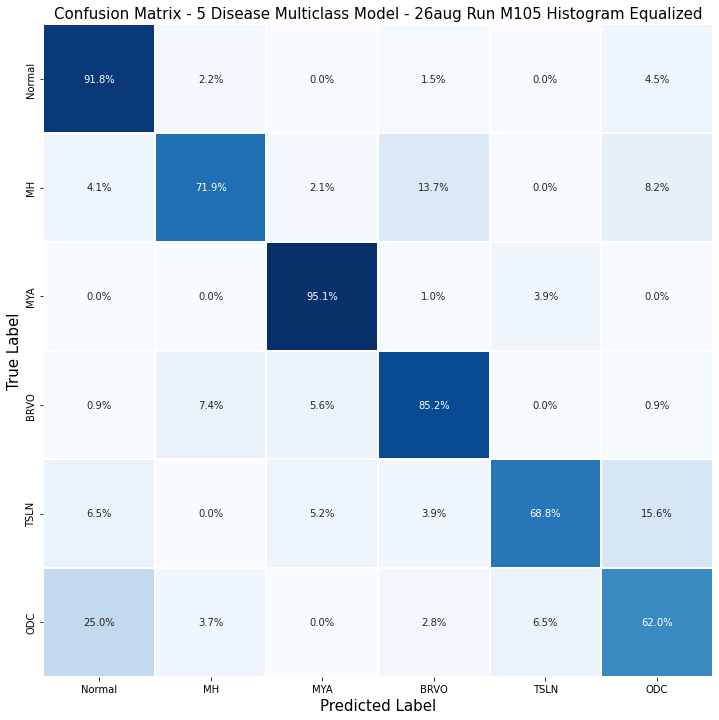

In [ ]:
# Construct the confusion matrix
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score

# Convert our test labels from one-hot encoding to label encoding
y_test_labels = np.argmax(y_test,axis=1)

conf_mat = confusion_matrix(y_test_labels, y_predict, normalize ='true') # setting 'true' to see recall score, set pred to see precision scores
normalized_conf_mat = conf_mat / (conf_mat.sum(axis=1))

plt.figure(figsize = (12,12))
sns.heatmap(conf_mat,
            fmt='.1%',
            annot=True,
            cbar=False,
            cmap="Blues",
            linewidths=1,
            xticklabels=LABELS,
            yticklabels=LABELS
           )
plt.title('Confusion Matrix-5 Disease Multiclass - RECALL - 26aug Run M105 Histogram Equalized',size = 15,y=1.01)
plt.xlabel("Predicted Label", size = 15)
plt.ylabel("True Label", size = 15)
plt.show()

The above matrix shows Recall score for each True/Predicted combination of classes. Recall is calculated row-wise. We see that Recall ranges from 62 for ODC to 95% for MYA (with 92% for Normal class). Therefore, this multiclass model has good predictive ability for all five diseases.

In [ ]:
# Construct the confusion matrix
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, accuracy_score

# Convert our test labels from one-hot encoding to label encoding
y_test_labels = np.argmax(y_test,axis=1)

conf_mat = confusion_matrix(y_test_labels, y_predict, normalize ='pred') # setting 'true' to see recall score, set pred to see precision scores
normalized_conf_mat = conf_mat / (conf_mat.sum(axis=1))

plt.figure(figsize = (12,12))
sns.heatmap(conf_mat,
            fmt='.1%',
            annot=True,
            cbar=False,
            cmap="Blues",
            linewidths=1,
            xticklabels=LABELS,
            yticklabels=LABELS
           )
plt.title('Confusion Matrix-5 Disease Multiclass - PRECISION - 26aug Run M105 Histogram Equalized',size = 15,y=1.01)
plt.xlabel("Predicted Label", size = 15)
plt.ylabel("True Label", size = 15)
plt.show()

The above matrix shows Precision score for each True/Predicted combination of classes. Precision is calculated column-wise. We see that Precision ranges from 62 for ODC to 95% for MYA (with 92% for Normal class). Therefore, this multiclass model has good precision for all five diseases.

dict_keys(['loss', 'get_f1', 'val_loss', 'val_get_f1', 'lr'])


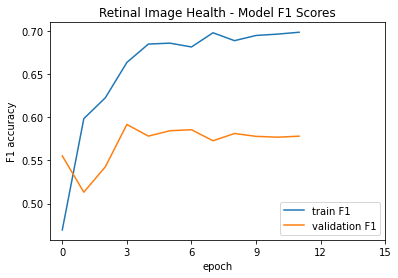

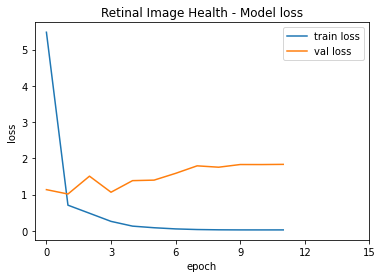

In [ ]:
# list all data in history
print(history.history.keys())

# Plot f1 scores (training, validation) over epochs
plt.plot(history.history['get_f1'])
plt.plot(history.history['val_get_f1'])
plt.title('Retinal Image Health - Model F1 Scores')
plt.ylabel('F1 accuracy')
plt.xlabel('epoch')
plt.xticks(np.arange(0,18,3))
plt.legend(['train F1', 'validation F1'])
plt.show()

# Plot Training and Validation loss over epochs
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Retinal Image Health - Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.xticks(np.arange(0,18,3))
plt.legend(['train loss', 'val loss'])
plt.show()

The Training loss quickly drops after a few epochs and then remains low over time. Experimentation with shorter and longer Number of Epochs resulted in different Recall and Precision scores. (done iteratively one at a time). 12 epochs selected as optimal for this model and hyperparameter tunings.

In [ ]:
# save model
model.save('Eye_Multiclass_5Disease_Inception_m105eq_26aug2022.h5')

In [ ]:
pip install scikit-plot

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# classification report
from sklearn.metrics import classification_report

report_initial = classification_report(y_test_labels, y_predict)
print(report_initial)

              precision    recall  f1-score   support

           0       0.76      0.92      0.83       134
           1       0.88      0.72      0.79       146
           2       0.88      0.95      0.92       102
           3       0.76      0.85      0.80       108
           4       0.83      0.69      0.75        77
           5       0.68      0.62      0.65       108

    accuracy                           0.80       675
   macro avg       0.80      0.79      0.79       675
weighted avg       0.80      0.80      0.79       675



#### Incorrectly Predicted Images
As our final evaluation of our model, we will look at the images that were incorrectly predicted to see if there are any patterns.

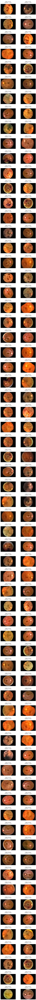

In [ ]:
import math

incorrect_photos = y_test_labels != y_predict

num_images = np.count_nonzero(incorrect_photos)
columns = 2
rows = math.ceil(num_images / columns)

fig, axes = plt.subplots(nrows=rows, ncols=columns, figsize=(10, 3.5*rows))

axes = axes.flatten()

for i, image in enumerate(X_test[incorrect_photos]):
    axes[i].imshow(image, cmap='gray')

    # Get predicted label
    predicted = y_predict[incorrect_photos][i]
    
    # Get actual label
    actual =  y_test_labels[incorrect_photos][i]

    #Get filename of image
    filenam = test_generator.filenames[i]
    x=filenam[8:]    

    # Set the title of the subplot
    axes[i].set_title(f"\n IMAGE: {x} \n Predicted: {predicted}   True: {actual}\n")
    
    # Hide the x and y ticks to make 
    axes[i].set_xticks([]) 
    axes[i].set_yticks([])
    
fig.tight_layout()

# Hide unused subplots
for i in range(num_images, rows*columns):
    fig.delaxes(axes[i])
plt.show()

Images above were examined for physical attributes (colour, markings, brightness, specific features related to specific diseases), trends or noticeable patterns in terms of predicted vs True classes. 

No observed pattern was seen in terms of physical appearance of misclassed images, or a pattern in terms of which images were predicted in one class but were in fact another class.

In [ ]:
# Count all misclassified images in a given test set

MISCLASSIFIED = num_images

# Accuracy calculations
total = Num_Test_Images
num_correct = total - (MISCLASSIFIED)
accuracy = num_correct/total

print('Accuracy: ' + str(accuracy))
print(f"Number of misclassified images = {MISCLASSIFIED}  out of {total}")

Accuracy: 0.8014814814814815
Number of misclassified images = 134  out of 675


# Concluding Statements

Therefore we had 80% test accuracy in accurately predicting which class an image belongs in our 6 class multiclass CNN model.

We also had 80% Recall (our key metric for this medical-related question, since we do not want to miss out positive disease cases as this would mean that a person needing care would not get it).

We had 79% F1 Score (weighted ave) and 80% Precision as well.

In conclusion, our CNN transfer learning model with InceptionV3 was effective in detecting each of our 5 key diseases of interest, with recall ranging from 62 to 95% above our diseases as shown below.

Future work could include development of single-disease classifiers for MH (related to cataracts), BRVO (related to strokes), TSLN (related to Myopia which itself was also a diagnosed disease with its own traits) and ODC (related to moderate to severe glaucoma cases). MYA is already showing excellent recall and precision with this model and so would not require a separate model.


           CLASS      precision    recall  f1-score   support

           0 - NORMAL   0.76      0.92      0.83       134
           1 - MH       0.88      0.72      0.79       146
           2 - MYA      0.88      0.95      0.92       102
           3 - BRVO     0.76      0.85      0.80       108
           4 - TSLN     0.83      0.69      0.75        77
           5 - ODC      0.68      0.62      0.65       108